In [ ]:
from IPython.display import clear_output

!pip install bertopic accelerate bitsandbytes xformers adjustText
!pip install cudf-cu11 dask-cudf-cu11 --extra-index-url=https://pypi.nvidia.com
!pip install cuml-cu11 --extra-index-url=https://pypi.nvidia.com
!pip install cugraph-cu11 --extra-index-url=https://pypi.nvidia.com
!pip install --upgrade cupy-cuda11x -f https://pip.cupy.dev/aarch64

clear_output()


In [ ]:
from torch import cuda
from huggingface_hub import notebook_login
from google.colab import drive
import pandas as pd
import numpy as np
from torch import bfloat16
import transformers
from sentence_transformers import SentenceTransformer
from bertopic import BERTopic
#from umap import UMAP
from hdbscan import HDBSCAN
import itertools
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from adjustText import adjust_text
import matplotlib.patheffects as pe
import textwrap
from bertopic.representation import KeyBERTInspired, MaximalMarginalRelevance, TextGeneration
from cuml.manifold import UMAP # I used cuml UMAP implementation for ram issues


In [ ]:
notebook_login()

In [ ]:
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
df = pd.read_csv("/content/drive/MyDrive/train.csv", sep=chr(1)).dropna(axis=0).drop_duplicates(subset="product_text").reset_index(drop=True)


In [ ]:

def stratified_sampling(df, N =150000):
  return df.groupby('category', group_keys=False).apply(lambda x: x.sample(int(np.rint(N*len(x)/len(df))))).sample(frac=1).reset_index(drop=True)


df= stratified_sampling(df)

docs = df["product_text"].values.tolist()


In [ ]:
model_name = 'meta-llama/Llama-2-13b-chat-hf'
device = "cuda"

In [ ]:
bnb_config = transformers.BitsAndBytesConfig(
    load_in_4bit=True,  # 4-bit quantization
    bnb_4bit_quant_type='nf4',  # Normalized float 4
    bnb_4bit_use_double_quant=True,  # Second quantization after the first
    bnb_4bit_compute_dtype=bfloat16  # Computation type
)

In [ ]:
# Llama 2 Tokenizer
tokenizer = transformers.AutoTokenizer.from_pretrained(model_name)

# Llama 2 Model
model = transformers.AutoModelForCausalLM.from_pretrained(
    model_name,
    trust_remote_code=True,
    quantization_config=bnb_config,
    device_map='auto',
)
model.eval()


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

LlamaForCausalLM(
  (model): LlamaModel(
    (embed_tokens): Embedding(32000, 5120)
    (layers): ModuleList(
      (0-39): 40 x LlamaDecoderLayer(
        (self_attn): LlamaAttention(
          (q_proj): Linear4bit(in_features=5120, out_features=5120, bias=False)
          (k_proj): Linear4bit(in_features=5120, out_features=5120, bias=False)
          (v_proj): Linear4bit(in_features=5120, out_features=5120, bias=False)
          (o_proj): Linear4bit(in_features=5120, out_features=5120, bias=False)
          (rotary_emb): LlamaRotaryEmbedding()
        )
        (mlp): LlamaMLP(
          (gate_proj): Linear4bit(in_features=5120, out_features=13824, bias=False)
          (up_proj): Linear4bit(in_features=5120, out_features=13824, bias=False)
          (down_proj): Linear4bit(in_features=13824, out_features=5120, bias=False)
          (act_fn): SiLUActivation()
        )
        (input_layernorm): LlamaRMSNorm()
        (post_attention_layernorm): LlamaRMSNorm()
      )
    )
    (norm

In [ ]:
generator = transformers.pipeline(
    model=model, tokenizer=tokenizer,
    task='text-generation',
    temperature=0.1,
    max_new_tokens=500,
    repetition_penalty=1.1
)

In [ ]:
prompt = "Can you give information about Trendyol company?"
res = generator(prompt)
print(res[0]["generated_text"])

Can you give information about Trendyol company?

Trendyol is a Turkish e-commerce platform that was founded in 2013 by Rocket Internet, a German startup accelerator. The company is headquartered in Istanbul and operates an online shopping portal that offers a wide range of products including fashion, home goods, electronics, and more.

Trendyol has quickly become one of the leading e-commerce platforms in Turkey, with over 5 million active customers and a presence in over 200 cities across the country. The company has also expanded into other markets, including the Middle East and North Africa.

One of the key features of Trendyol is its focus on fast and affordable delivery. The company offers same-day delivery in many cities, as well as a range of payment options and a user-friendly interface. Trendyol also offers a loyalty program and a range of promotions and discounts to its customers.

In addition to its e-commerce platform, Trendyol also operates a number of physical stores in 

In [ ]:
# System prompt describes information given to all conversations
system_prompt = """
<s>[INST] <<SYS>>
You are a helpful, respectful and honest assistant for labeling topics.
<</SYS>>
"""

In [ ]:
# Example prompt demonstrating the output we are looking for
example_prompt = """
I have a topic that contains the following documents:
  -Kadın Lacivert Bol Paça Pantolon
  -Moda Tutkusu Kolları Detaylı Desenli Bluz
  -Erkek Ndigo Puantiyeli Gömlek
  -By Umut 6 Çift Erkek Patik Çorap Spor Ayakkabı Kısa Soket Yazlık Çorabı Siyah
  -Dantel İşlemeli İpek Elbise
  -Çiçek Desenli Pijama Takım Pembe
  -Kadın Dolgusuz Basic Sütyen 2150
  -Siyah Kadın Batik Eşofman Altı
  -Slim Fit Slogan Desenli Uzun Kollu Sweatshirt

The topic is described by the following keywords: 'Pantolon, Bluz, Çorap, Elbise, Pijama Takımı, Sütyen, Eşofman Altı, Sweatshirt, Gömlek'.

Based on the information about the topic above, please create a short label of this topic. Make sure you to only return the label and nothing more.

[/INST] Giyim ürünleri
"""

In [ ]:
# Our main prompt with documents ([DOCUMENTS]) and keywords ([KEYWORDS]) tags
main_prompt = """
[INST]
I have a topic that contains the following documents:
[DOCUMENTS]

The topic is described by the following keywords: '[KEYWORDS]'.

Based on the information about the topic above, please create a short label of this topic. Make sure you to only return the label and nothing more.
[/INST]
"""

In [ ]:
prompt = system_prompt + example_prompt + main_prompt

In [ ]:

# Pre-calculate embeddings
#embedding_model_name = "sentence-transformers/distiluse-base-multilingual-cased-v2"

embedding_model_name = "emrecan/bert-base-turkish-cased-mean-nli-stsb-tr"
embedding_model = SentenceTransformer(embedding_model_name)
embeddings = embedding_model.encode(docs, show_progress_bar=True)

Batches:   0%|          | 0/4687 [00:00<?, ?it/s]

In [ ]:
umap_model = UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine', random_state=42)
hdbscan_model = HDBSCAN(min_cluster_size=500, metric='euclidean', cluster_selection_method='eom', prediction_data=True)

In [ ]:
# Pre-reduce embeddings for visualization purposes
reduced_embeddings = UMAP(n_neighbors=15, n_components=2, min_dist=0.0, metric='cosine', random_state=42).fit_transform(embeddings)

In [ ]:

# KeyBERT
keybert = KeyBERTInspired()

# MMR
mmr = MaximalMarginalRelevance(diversity=0.3)

# Text generation with Llama 2
llama2 = TextGeneration(generator, prompt=prompt)

# All representation models
representation_model = {
    "KeyBERT": keybert,
    "Llama2": llama2,
    "MMR": mmr,
}

In [ ]:

topic_model = BERTopic(

  # Sub-models
  embedding_model=embedding_model,
  umap_model=umap_model,
  hdbscan_model=hdbscan_model,
  representation_model=representation_model,

  # Hyperparameters
  top_n_words=10,
  verbose=True
)

# Train model
topics, probs = topic_model.fit_transform(docs, embeddings)


2023-11-13 19:30:22,060 - BERTopic - Reduced dimensionality
2023-11-13 19:32:33,212 - BERTopic - Clustered reduced embeddings
100%|██████████| 5/5 [00:16<00:00,  3.32s/it]


In [ ]:
# Show topics
topic_model.get_topic_info()

,Topic,Count,Name,Representation,KeyBERT,Llama2,MMR,Representative_Docs
0,-1,4965,-1_tv_kenar_paspas_boya,"[tv, kenar, paspas, boya, plus, halı, gözlüğü,...","[halı, paspas, desen, boya, paneli, gri, prest...","[\n Otomobil Gözlüğü, , , , , , , , , ]","[tv, kenar, paspas, boya, plus, halı, gözlüğü,...",[Fiat Fiorino 2007 Ve Sonrası Uyumlu Mavi Halı...
1,0,120173,0_kadın_siyah_erkek_cm,"[kadın, siyah, erkek, cm, adet, ve, beyaz, der...","[gömlek, deri, sweatshirt, erkek, triko, elbis...","[Giyim ürünleri (kadın, siyah, erkek, cm, adet...","[kadın, siyah, erkek, cm, adet, ve, beyaz, der...","[Erkek Bordo Pijama Seti 5'li, 2 Li Set Baby B..."
2,1,12131,1_uyumlu_şarj_telefon_kulaklık,"[uyumlu, şarj, telefon, kulaklık, araç, blueto...","[telefon, bluetooth, şarj, kulaklığı, pil, cih...","[Teknik Ürünleri, , , , , , , , , ]","[uyumlu, şarj, telefon, kulaklık, araç, blueto...",[Huawei Y8p Uyumlu Araç Çakmaklık Şarj Bluetoo...
3,2,10569,2_gümüş_kolye_küpe_taşlı,"[gümüş, kolye, küpe, taşlı, bileklik, ayar, al...","[gümüş, kolye, bilezik, pırlanta, incili, yüzü...","[Gümüş ve Altın Kolye, , , , , , , , , ]","[gümüş, kolye, küpe, taşlı, bileklik, ayar, al...",[925 Ayar Gümüş Turkuaz Zirkon Taşlı Trend Kol...
4,3,2138,3_kordon_saati_watch_kol,"[kordon, saati, watch, kol, saat, apple, kordo...","[bileklik, 44mm, 44, 38mm, kordon, çelik, kord...","[Apple Watches, , , , , , , , , ]","[kordon, saati, watch, kol, saat, apple, kordo...",[Apple Watch 3 Series 38mm Kordon Deri Loop Si...


In [ ]:
topic_model.get_topic(1, full=True)["KeyBERT"]

[('telefon', 0.49759334),
 ('bluetooth', 0.4039409),
 ('şarj', 0.39304417),
 ('kulaklığı', 0.38024795),
 ('pil', 0.3659716),
 ('cihazı', 0.3611237),
 ('notebook', 0.35702986),
 ('samsung', 0.35141),
 ('iphone', 0.35013533),
 ('batarya', 0.34300026)]

In [ ]:
topic_model.get_topic(1, full=True)["MMR"]

[('uyumlu', 0.13139373715659705),
 ('şarj', 0.11474291969008478),
 ('telefon', 0.07429751328113149),
 ('kulaklık', 0.0716938397813388),
 ('araç', 0.06942272520393677),
 ('bluetooth', 0.06778925720879057),
 ('içi', 0.06702177495844568),
 ('galaxy', 0.06365211150671111),
 ('kılıf', 0.05779007816167337),
 ('samsung', 0.05348232150183841)]

In [ ]:
topic_model.get_topic(1, full=True)["Llama2"]

[('Teknik Ürünleri', 1),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0)]

In [ ]:
topic_model.get_topic(2, full=True)["Llama2"]

[('Gümüş ve Altın Kolye', 1),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0)]

In [ ]:
topic_model.get_topic(3, full=True)["Llama2"]

[('Apple Watches', 1),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0)]

In [ ]:
llama2_labels = [label[0][0].split("\n")[0] for label in topic_model.get_topics(full=True)["Llama2"].values()]
topic_model.set_topic_labels(llama2_labels)

In [ ]:
topic_model.visualize_documents(df["category"], reduced_embeddings=reduced_embeddings, hide_annotations=True, hide_document_hover=False, custom_labels=True)

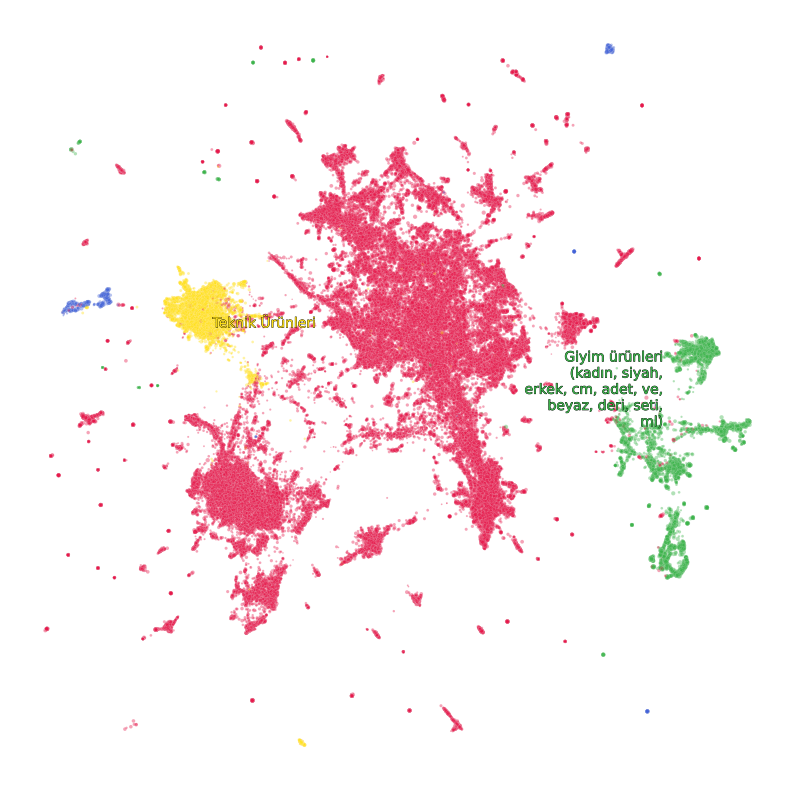

In [ ]:

# Define colors for the visualization to iterate over
colors = itertools.cycle(['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', '#000075', '#808080', '#ffffff', '#000000'])
color_key = {str(topic): next(colors) for topic in set(topic_model.topics_) if topic != -1}

# Prepare dataframe and ignore outliers
df = pd.DataFrame({"x": reduced_embeddings[:, 0], "y": reduced_embeddings[:, 1], "Topic": [str(t) for t in topic_model.topics_]})
df["Length"] = [len(doc) for doc in docs]
df = df.loc[df.Topic != "-1"]
df = df.loc[(df.y > -10) & (df.y < 10) & (df.x < 10) & (df.x > -10), :]
df["Topic"] = df["Topic"].astype("category")

# Get centroids of clusters
mean_df = df.groupby("Topic").mean().reset_index()
mean_df.Topic = mean_df.Topic.astype(int)
mean_df = mean_df.sort_values("Topic")


fig = plt.figure(figsize=(10, 10))
sns.scatterplot(data=df, x='x', y='y', c=df['Topic'].map(color_key), alpha=0.4, sizes=(0.4, 10), size="Length")

# Annotate top 50 topics
texts, xs, ys = [], [], []
for row in mean_df.iterrows():
  topic = row[1]["Topic"]
  name = textwrap.fill(topic_model.custom_labels_[int(topic)], 20)

  if int(topic) <= 2:
    xs.append(row[1]["x"])
    ys.append(row[1]["y"])
    texts.append(plt.text(row[1]["x"], row[1]["y"], name, size=10, ha="center", color=color_key[str(int(topic))],
                          path_effects=[pe.withStroke(linewidth=0.5, foreground="black")]
                          ))

# Adjust annotations such that they do not overlap
adjust_text(texts, x=xs, y=ys, time_lim=1, force_text=(0.01, 0.02), force_static=(0.01, 0.02), force_pull=(0.5, 0.5))
plt.axis('off')
plt.legend('', frameon=False)
plt.show()

In [ ]:
from google.colab import runtime
runtime.unassign()